In [1]:
import os
import cv2
import keras
import numpy as np
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2,ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K

AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

2024-05-19 23:56:36.281376: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-19 23:56:36.306748: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-19 23:56:36.671257: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Tensorflow ver. 2.16.1


In [2]:
# Input image size that we are going to use
IMAGE_SIZE = 512
num_classes = 4
# Set batch size
batch = 8
# Set learning rate
LR = 1e-4
# Set epoch
EPOCHS = 40

In [3]:
# Set image and mask paths
image_path = "IE-dataset-All-tts-augmented/IE-dataset-All-tts-augmented/images/"
mask_path = "IE-dataset-All-tts-augmented/IE-dataset-All-tts-augmented/masks/"
training_data = "train/"
val_data = "validation/"
test_data = "test/"

In [4]:
# Function to create lists of paths for training, validation and testing data
def load_data():
  extensions = ["*.jpg", "*.tif", "*.tiff"]
  file_patterns = [os.path.join(image_path, training_data, ext) for ext in extensions]

  TRAIN_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # TRAIN_X = sorted(glob(os.path.join(image_path + training_data, "*.jpg")))
  train_x = TRAIN_X

  TRAIN_Y = sorted(glob(os.path.join(mask_path + training_data, "*.png")))
  train_y = TRAIN_Y

  file_patterns = [os.path.join(image_path, val_data, ext) for ext in extensions]
  VALID_TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # VALID_TEST_X = sorted(glob(os.path.join(image_path + val_data, "*.jpg")))
  valid_x = VALID_TEST_X

  VALID_TEST_Y = sorted(glob(os.path.join(mask_path + val_data, "*.png")))
  valid_y = VALID_TEST_Y

  file_patterns = [os.path.join(image_path, test_data, ext) for ext in extensions]
  TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  test_x = TEST_X
  TEST_Y = sorted(glob(os.path.join(mask_path + test_data, "*.png")))
  test_y = TEST_Y

  return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

In [5]:
(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_data()

print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Test data: ", len(test_x))

Training data:  308
Validation data:  16
Test data:  15


In [6]:
# Set image augmentation (to be called by tensorflow dataset later)
data_augmentation = tf.keras.Sequential([
  # layers.RandomFlip("horizontal_and_vertical"),
  # layers.RandomRotation(0.2),
  # layers.RandomZoom(.5, .2),
  # layers.RandomContrast(0.1)
  ],
  )

In [7]:
# Functions to read image and mask paths to output numpy arrays
def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = np.expand_dims(x, axis=-1)
    return x

In [8]:
# Function to generate tensorflow dataset 
def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float64, tf.uint8])
    x.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
    y.set_shape([IMAGE_SIZE, IMAGE_SIZE, 1])
    return x, y

num_threads = 4

def tf_dataset_train(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=5000)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    # newdataset = dataset.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(1)
    return dataset
    


def tf_dataset_valid(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(1)
    return dataset

In [9]:
train_dataset = tf_dataset_train(train_x, train_y)
valid_dataset = tf_dataset_valid(valid_x, valid_y)
test_dataset = tf_dataset_valid(test_x, test_y)

2024-05-19 23:56:37.285139: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-19 23:56:37.285784: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [10]:
# Function to load image/mask and convert colour space from BGR to RGB so that image/mask can be displayed correctly by matplotlib
def read_and_rgb(x):
    x = cv2.imread(x)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    return x

In [11]:
# Function for conv2d_block (to be used for building decoder of unet)
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size), kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

In [12]:
# Function for unet model creation
def unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4):

    # Contracting Path (encoder)
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    encoder = ResNet50(input_tensor=inputs, include_top=False,weights="imagenet")
    BASE_WEIGHT_PATH = ('https://github.com/fchollet/deep-learning-models/releases/download/v0.1/')
    model_name = 'resnet50_weights_tf_dim_ordering_tf_kernels.h5'
    weight_path = BASE_WEIGHT_PATH + model_name
    weights_path = keras.utils.get_file(model_name, weight_path)
    encoder.load_weights(weights_path, by_name=True, skip_mismatch=True)

    skip_connection_names = ["input_image", "conv1_relu", "conv2_block3_out", "conv3_block4_out","conv4_block6_out"]
    encoder_output = encoder.get_layer("conv5_block3_2_relu").output

    x = encoder_output
    x_skip_1 = encoder.get_layer(skip_connection_names[-1]).output # 224x224
    x_skip_2 = encoder.get_layer(skip_connection_names[-2]).output # 112x112
    x_skip_3 = encoder.get_layer(skip_connection_names[-3]).output # 56x56
    x_skip_4 = encoder.get_layer(skip_connection_names[-4]).output # 28x28
    x_skip_5 = encoder.get_layer(skip_connection_names[-5]).output # 14x14


    # Expansive Path (decoder)
    u6 = Conv2DTranspose(n_filters * 14, (3, 3), strides = (2, 2), padding = 'same')(x)
    u6 = concatenate([u6, x_skip_1])
    c6 = conv2d_block(u6, n_filters * 14, kernel_size = 3, batchnorm = batchnorm)
    p6 = Dropout(dropout)(c6)

    u7 = Conv2DTranspose(n_filters * 13, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, x_skip_2])
    c7 = conv2d_block(u7, n_filters * 13, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c7)

    u8 = Conv2DTranspose(n_filters * 12, (3, 3), strides = (2, 2), padding = 'same')(p7)
    u8 = concatenate([u8, x_skip_3])
    c8 = conv2d_block(u8, n_filters * 12, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c8)

    u9 = Conv2DTranspose(n_filters * 11, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, x_skip_4])
    c9 = conv2d_block(u9, n_filters * 11, kernel_size = 3, batchnorm = batchnorm)
    p9 = Dropout(dropout)(c9)
    
    u10 = Conv2DTranspose(n_filters * 10, (3, 3), strides = (2, 2), padding = 'same')(p9)
    u10 = concatenate([u10, x_skip_5])
    c10 = conv2d_block(u10, n_filters * 10, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c10)

    model = Model(inputs=inputs, outputs=outputs)
    
    return model

In [13]:
model = unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4)

In [14]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 518, 518,  │          0 │ input_image[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 256, 256,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 256, 256,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 258, 258,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 128, 128,  │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 128, 128,  │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 128, 128,  │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 128, 128,  │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 128, 128,  │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 128, 128,  │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 128, 128,  │      1,024 │ conv2_block1_3_c

 Total params: 30,156,644 (115.04 MB)

 Trainable params: 30,105,700 (114.84 MB)

 Non-trainable params: 50,944 (199.00 KB)

In [15]:
# tf.keras.utils.plot_model(model,show_shapes=True)

In [16]:
# Specify all the encoder layers in a list
encoder_layers = model.layers[0:-27]

In [17]:
# Freeze the encoder layers for transfer learning (so that weights are only Augmentedchanged for the decoder layers druing training)
for layer in encoder_layers:
    layer.trainable = False
    # print(layer, layer.trainable)

In [18]:
# Functions for dice coefficient and dice loss 

import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1e-7):
    y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=4)[Ellipsis,1:])
    y_pred_f = K.flatten(y_pred[...,1:])
    intersect = K.sum(y_true_f * y_pred_f, axis=-1)
    true_sum = K.sum(y_true_f , axis=-1)
    pred_sum = K.sum(y_pred_f, axis=-1)
    return K.mean((2. * intersect / (true_sum+pred_sum + smooth)))

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def mean_iou(y_true, y_pred, num_classes=4):
  smooth = 1e-7  
  y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=num_classes)[..., 1:])
  y_pred_f = K.flatten(y_pred[..., 1:])
  intersection = K.sum(K.cast(y_true_f * y_pred_f, dtype='float32'), axis=-1)
  set_sum = K.sum(K.cast(y_true_f + y_pred_f, dtype='float32'), axis=-1)
  iou = (intersection + smooth) / (set_sum -intersection+ smooth)
  mIoU = K.mean(iou)
  return mIoU

def mIoU_loss(y_true, y_pred):
    return 1 - mean_iou(y_true, y_pred)
   


In [19]:
# Set up loss function, optimiser and complile the model 
opt = tf.keras.optimizers.AdamW(LR)
metrics = [dice_coef,mean_iou]
model.compile(loss=mIoU_loss, optimizer=opt, metrics=metrics)
#model.compile(optimizer=opt, loss = tf.keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])

In [20]:
# Set up early stopping and reduce learning rate on plateau
early_stopping = EarlyStopping(
    monitor='mean_iou', 
    patience=4, 
    mode='max'
)

reduce_lr = ReduceLROnPlateau(
    monitor='mean_iou', 
    factor=0.3,   
    patience=3, 
    min_lr=0.00001,
)


In [21]:
# Set up checkpoint for saving model architecture and weights
checkpoint_filepath = 'checkpoint.model.keras'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='mean_iou',
    mode='max',
    save_best_only=True)

In [22]:
# Commencement of training
train_steps = len(train_x)//batch
valid_steps = len(valid_x)//batch

if len(train_x) % batch != 0: 
    train_steps += 1
if len(valid_x) % batch != 0: 
    valid_steps += 1

history=model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=[model_checkpoint_callback,reduce_lr]
)


Epoch 1/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 577s 15s/step - dice_coef: 0.4149 - loss: 0.7288 - mean_iou: 0.2712 - val_dice_coef: 0.1941 - val_loss: 0.8886 - val_mean_iou: 0.1114 - learning_rate: 1.0000e-04
Epoch 2/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 579s 15s/step - dice_coef: 0.6391 - loss: 0.5232 - mean_iou: 0.4768 - val_dice_coef: 0.0088 - val_loss: 0.9956 - val_mean_iou: 0.0044 - learning_rate: 1.0000e-04
Epoch 3/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 580s 15s/step - dice_coef: 0.6695 - loss: 0.4917 - mean_iou: 0.5083 - val_dice_coef: 0.0173 - val_loss: 0.9913 - val_mean_iou: 0.0087 - learning_rate: 1.0000e-04
Epoch 4/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 579s 15s/step - dice_coef: 0.6939 - loss: 0.4648 - mean_iou: 0.5352 - val_dice_coef: 0.0465 - val_loss: 0.9761 - val_mean_iou: 0.0239 - learning_rate: 1.0000e-04
Epoch 5/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 582s 15s/step - dice_coef: 0.7160 - loss: 0.4398 - mean_iou: 0.5602 - val_dice_coef: 0.4431 - val_loss: 0.7078 - val_mean_iou: 0.2922 - learning_rate: 3.0000e-05


In [23]:
# history=model.fit(
#     train_dataset,
#     validation_data = valid_dataset,
#     epochs=15,
#     steps_per_epoch=train_steps,
#     validation_steps=valid_steps,
#     callbacks=[model_checkpoint_callback,reduce_lr]
# )


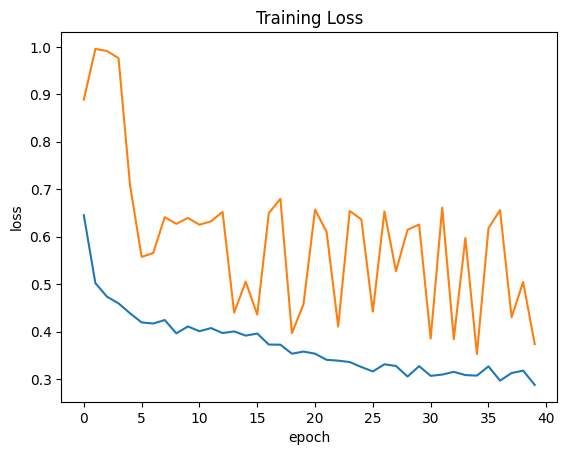

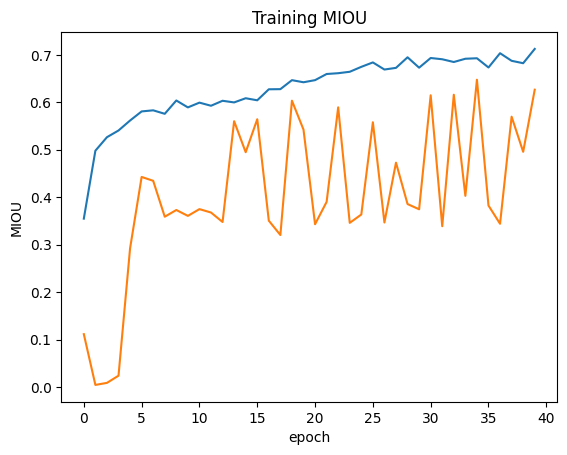

In [24]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()
plt.plot(history.history["mean_iou"])
plt.plot(history.history["val_mean_iou"])
plt.title("Training MIOU")
plt.ylabel("MIOU")
plt.xlabel("epoch")
plt.show()

In [25]:
def display_sample(sample_image,sample_mask_seperated,pred_mask_seperated):
    # plt.figure(figsize=(16, 16))
    title = ['bg','fat','cell','bone']
    # for i in range(len(display_list)):
    #     plt.subplot(1, len(display_list), i+1)
    #     plt.title(title[i])
    #     plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]),cmap='gray')
    #     plt.axis('off')
    # plt.show()

    fig,axs=plt.subplots(2,5,figsize=(30,12))
    axs[0][0].imshow(sample_image)
    axs[0][0].axis('off')
    axs[0][0].set_title('Original Image')
    for i in range(4):
        axs[0][i+1].imshow(sample_mask_seperated[i],cmap='gray')
        axs[0][i+1].axis('off')
        axs[0][i+1].set_title(f'Original {title[i]}')
    for i in range(4):
        axs[1][i+1].imshow(pred_mask_seperated[i],cmap='gray')
        axs[1][i+1].axis('off')
        axs[1][i+1].set_title(f'Predicted {title[i]}')
    plt.show()

In [26]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1) 
    pred_mask = tf.expand_dims(pred_mask, axis=-1)
    return pred_mask
    
def show_predictions(sample_image,sample_mask):
    one_img = sample_image[0][tf.newaxis, ...] 
    prediction = model.predict(one_img)
    pred_mask = create_mask(prediction)

    sample_mask_seperated=[(sample_mask[0]==i) for i in [0,1,2,3]]
    pred_mask_seperated=[(pred_mask[0]==i) for i in [0,1,2,3]]

    display_sample(sample_image[0], sample_mask_seperated,pred_mask_seperated)#sample_mask_seperated, pred_mask_seperated)
    
    fat_true=np.sum(sample_mask_seperated[1])
    cell_true=np.sum(sample_mask_seperated[2])
    fat_pred=np.sum(pred_mask_seperated[1])
    cell_pred=np.sum(pred_mask_seperated[2])
    cellularity_true=(cell_true*100)/(cell_true+fat_true)
    cellularity_pred=(cell_pred*100)/(cell_pred+fat_pred)
    cellularity_accuracy=(1-abs(cellularity_pred-cellularity_true)/100)*100
    print(f"cellulu true={cellularity_true:.3f}%\tcellulu pred='{cellularity_pred:.3f}%\tDifference={cellularity_accuracy:.3f}%")
    return cellularity_accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 100s 100s/step


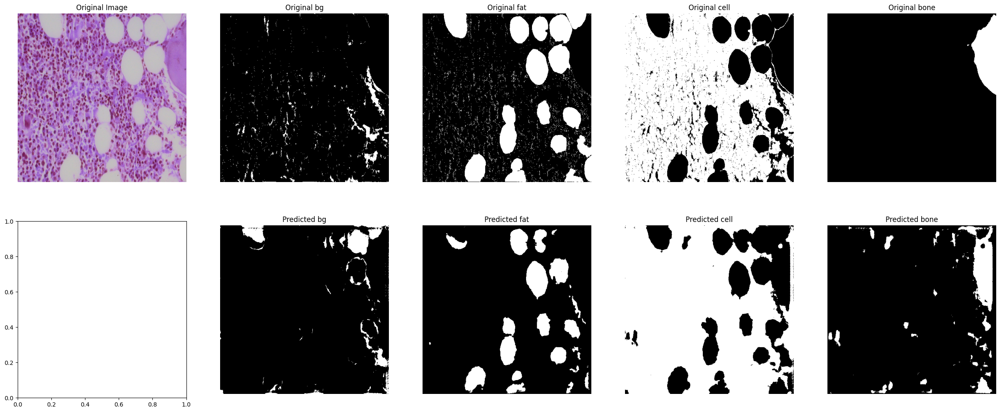

cellulu true=75.874%	cellulu pred='85.303%	Difference=90.571%
1/1 ━━━━━━━━━━━━━━━━━━━━ 99s 99s/step


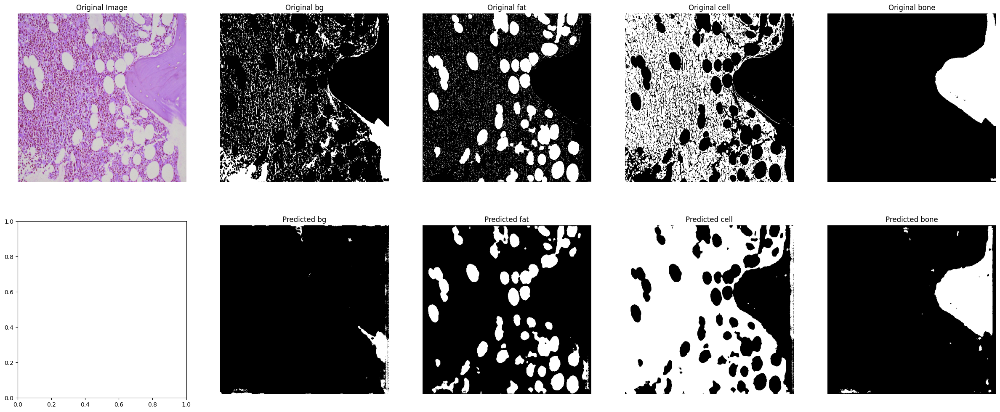

cellulu true=68.499%	cellulu pred='79.316%	Difference=89.183%
1/1 ━━━━━━━━━━━━━━━━━━━━ 101s 101s/step


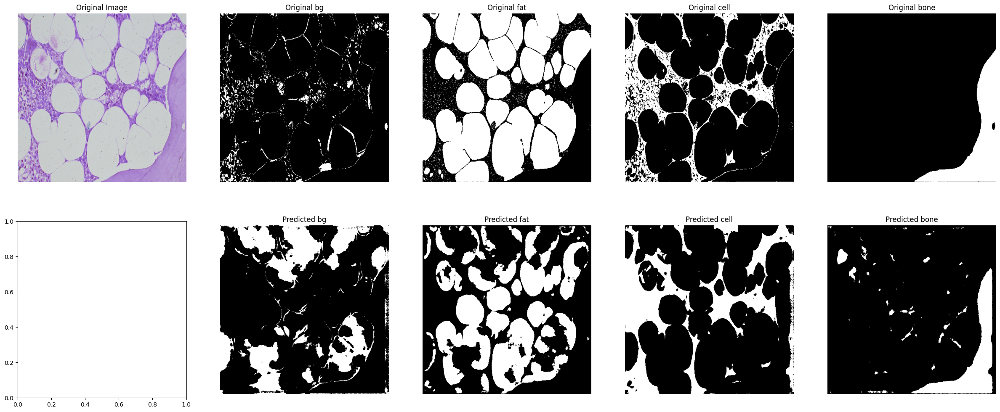

cellulu true=23.052%	cellulu pred='39.252%	Difference=83.800%
1/1 ━━━━━━━━━━━━━━━━━━━━ 97s 97s/step


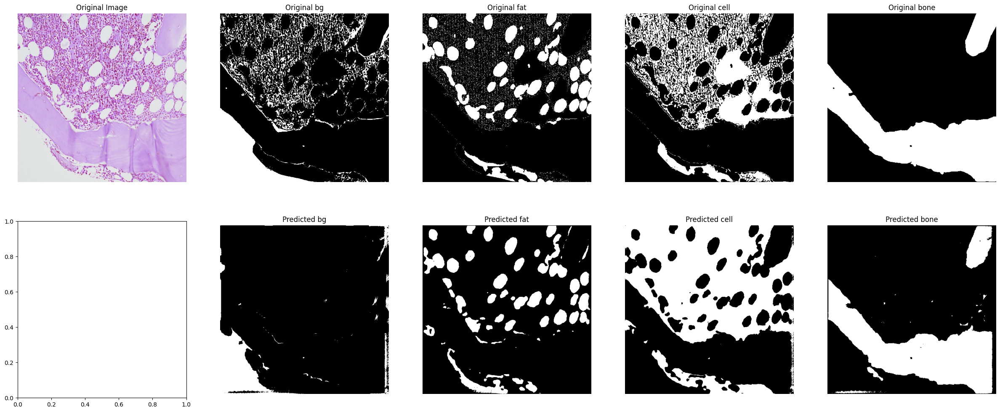

cellulu true=62.413%	cellulu pred='76.120%	Difference=86.293%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


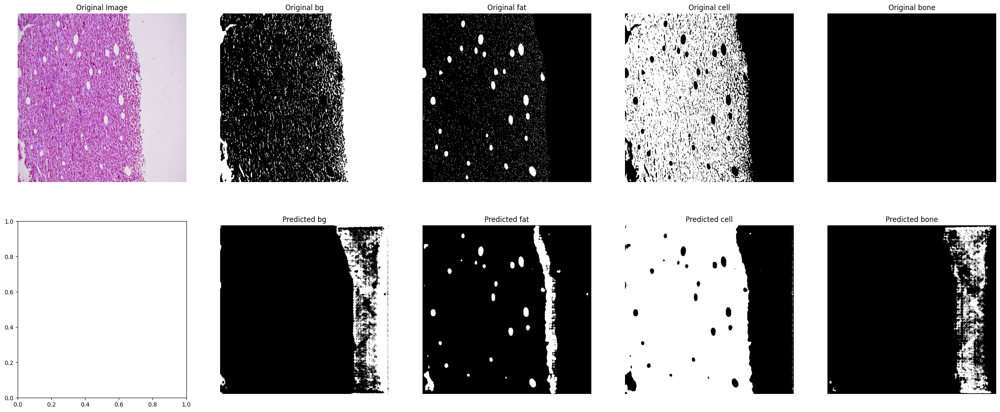

cellulu true=91.724%	cellulu pred='91.560%	Difference=99.836%
1/1 ━━━━━━━━━━━━━━━━━━━━ 99s 99s/step


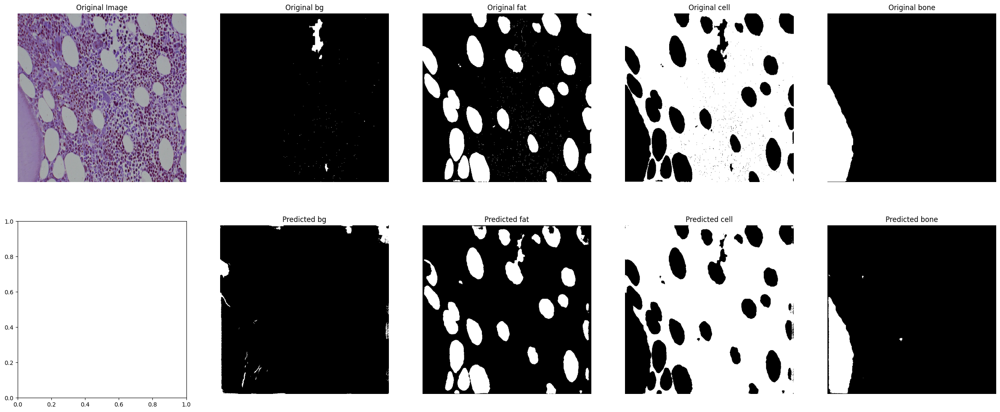

cellulu true=77.484%	cellulu pred='80.184%	Difference=97.300%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


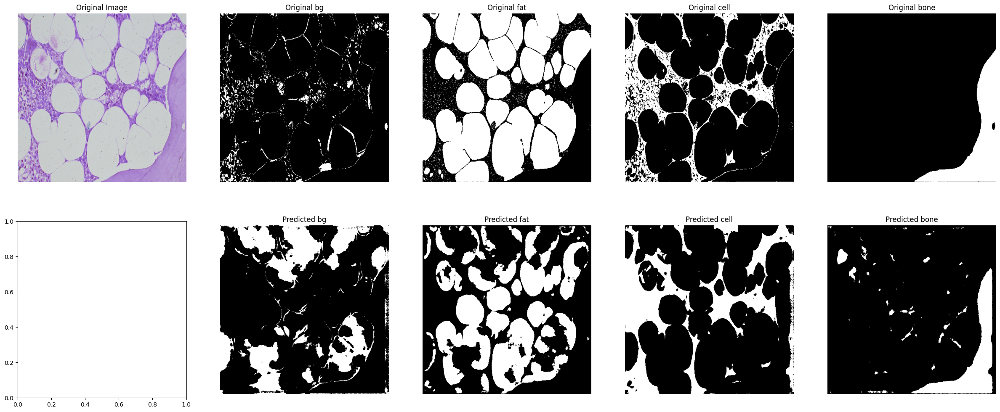

cellulu true=23.052%	cellulu pred='39.252%	Difference=83.800%
1/1 ━━━━━━━━━━━━━━━━━━━━ 99s 99s/step


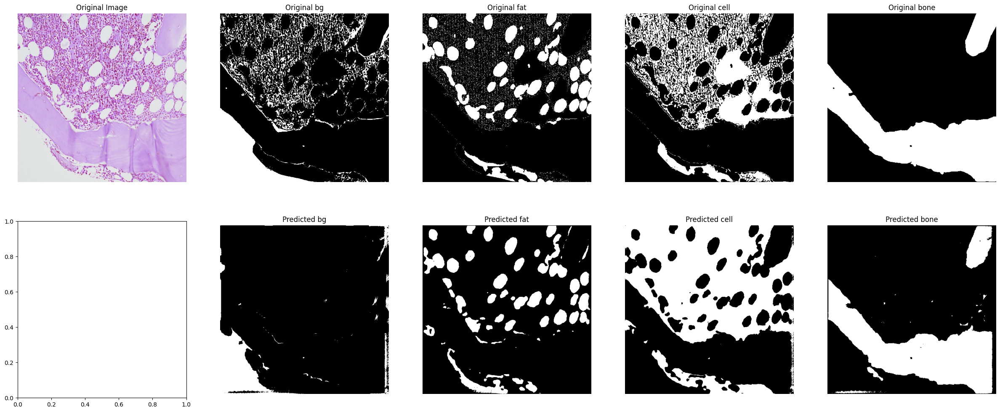

cellulu true=62.413%	cellulu pred='76.120%	Difference=86.293%
1/1 ━━━━━━━━━━━━━━━━━━━━ 101s 101s/step


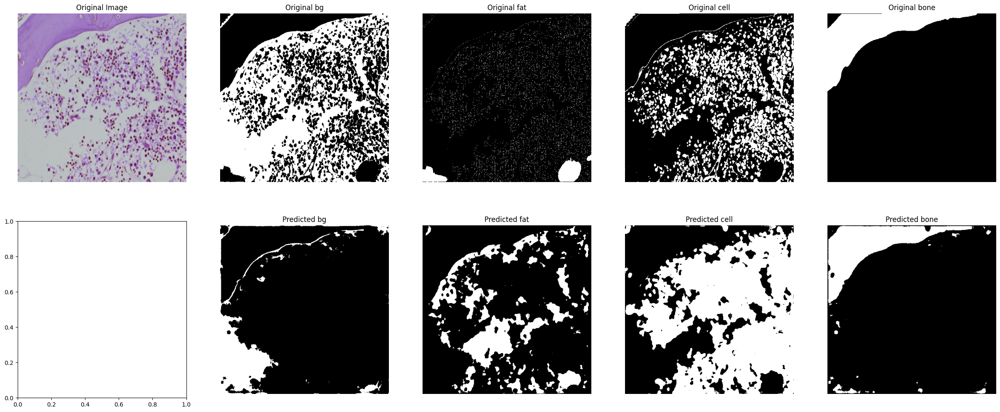

cellulu true=84.041%	cellulu pred='74.684%	Difference=90.642%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


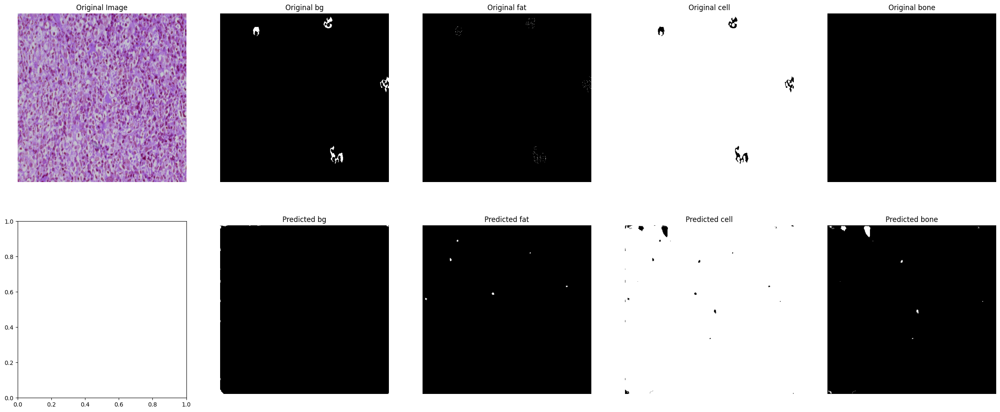

cellulu true=99.937%	cellulu pred='99.941%	Difference=99.996%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


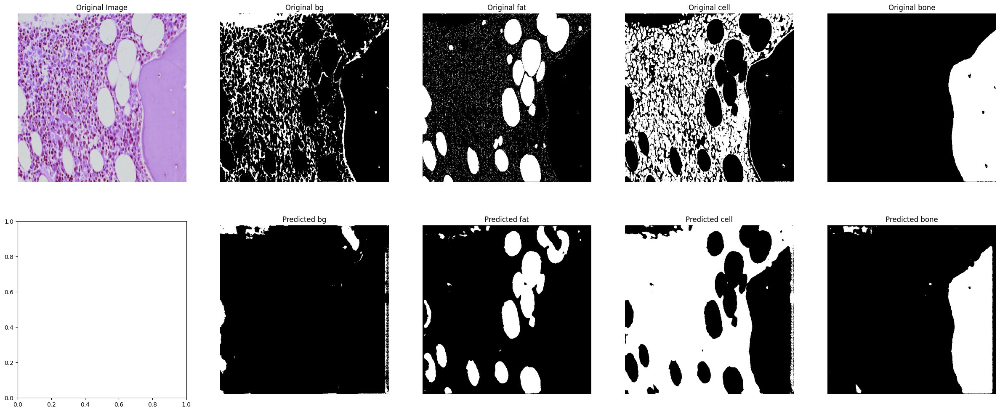

cellulu true=65.769%	cellulu pred='80.450%	Difference=85.319%
1/1 ━━━━━━━━━━━━━━━━━━━━ 99s 99s/step


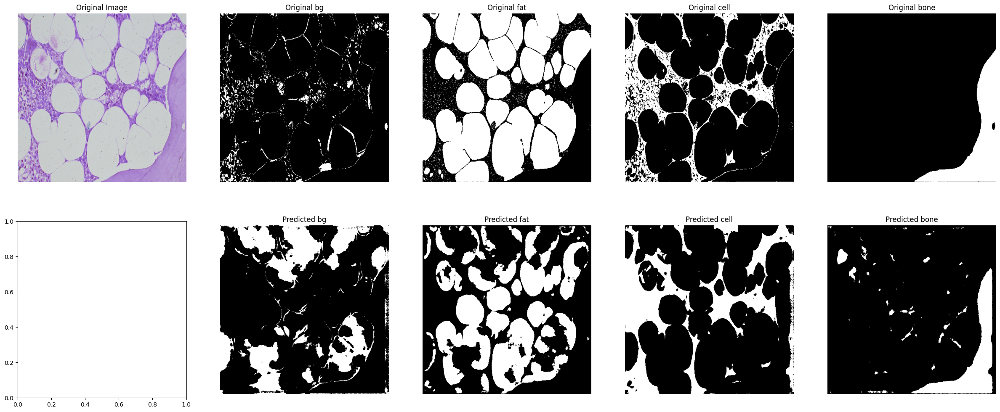

cellulu true=23.052%	cellulu pred='39.252%	Difference=83.800%
1/1 ━━━━━━━━━━━━━━━━━━━━ 99s 99s/step


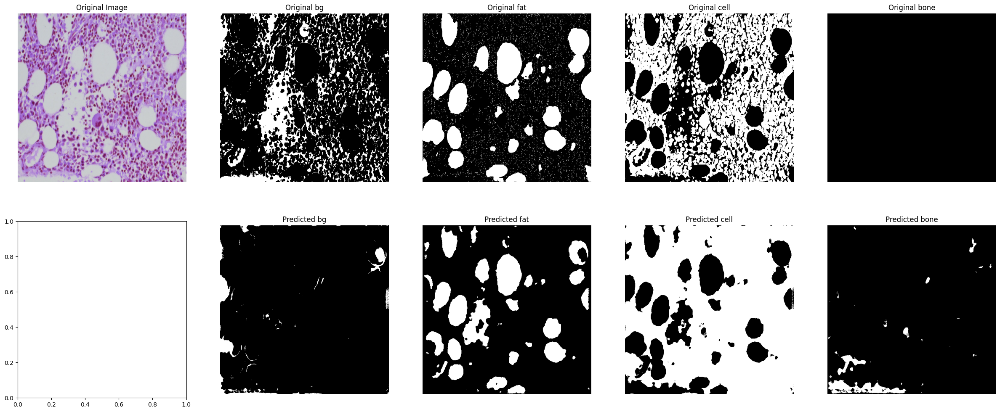

cellulu true=68.753%	cellulu pred='78.753%	Difference=90.000%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


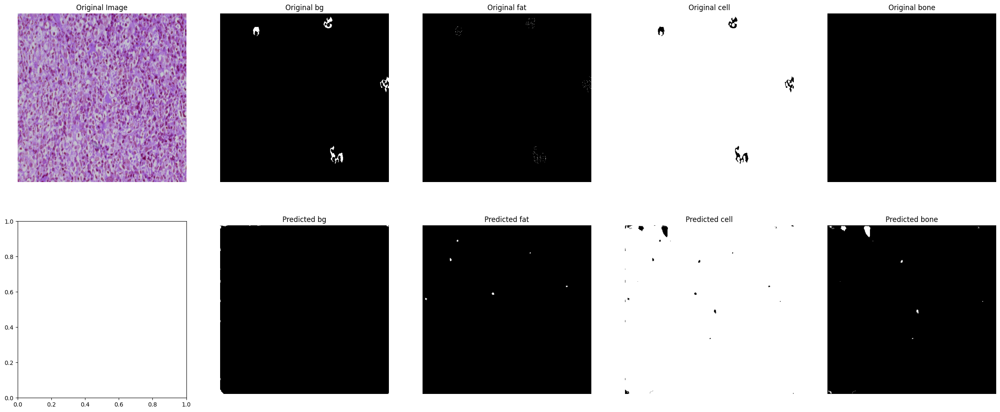

cellulu true=99.937%	cellulu pred='99.941%	Difference=99.996%
1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


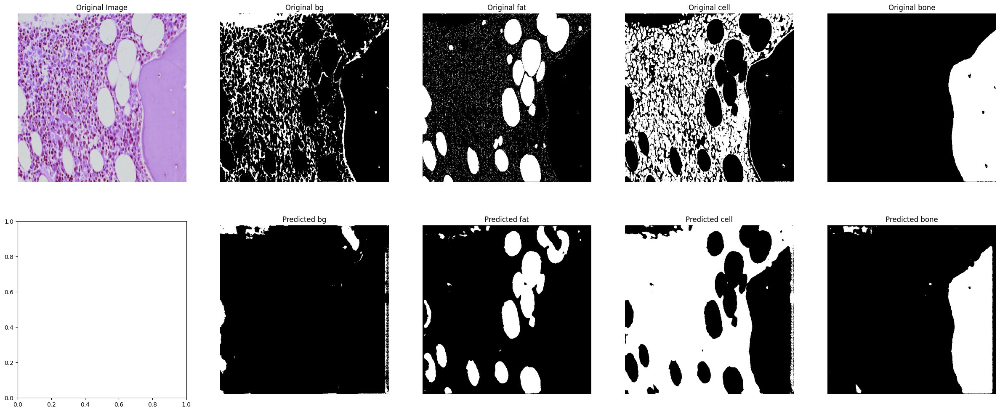

cellulu true=65.769%	cellulu pred='80.450%	Difference=85.319%


2024-05-20 06:48:06.205730: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [27]:
# for i in range(15):
net_cellulu=0
totalMasks=15

for image, mask in test_dataset.take(15):
        sample_image, sample_mask = image, mask
        net_cellulu+=show_predictions(sample_image, sample_mask)

In [28]:
test_steps = len(test_x)//batch
if len(test_x) % batch != 0: 
    test_steps += 1

result = model.evaluate(test_dataset, steps=test_steps)
dict(zip(model.metrics_names, result))
print(f"Testing Cellularity Accuracy={(net_cellulu/totalMasks):.3f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 4s/step - dice_coef: 0.7985 - loss: 0.3350 - mean_iou: 0.6650
Testing Cellularity Accuracy=90.143%


In [29]:
# model.save('model_saves/resnet50_512.h5')  # Saves in the older HDF5 format
model.save('model_saves/resnet50_512.keras')  # Recommended format (uses ZIP archive)

: 